# Building


## Model description

The model corresponds to a building (the Los Angeles University Hospital) with
8 floors each having 3 degrees of freedom, namely displacements in $x$ and $y$
directions, and rotation [^ASG00]. Such 24 variables evolve according to
$$
  M\ddot{q}(t) + C\dot{q}(t) + Kq(t) = vu(t),
$$
where $u(t)$ is the input. This system can be put into a traditional state-space
form of order 48 by defining $x = (q, \dot{q})^T$. We are interested in the
motion of the first coordinate $q_1(t)$, hence we choose $v = (1, 0, \ldots, 0)^T$
and the output $y(t) = \dot{q}_1(t) = x_{25}(t)$. In canonical form,

$$
  \begin{array}{lcl}
  \dot{x}(t) &=& Ax(t) + Bu(t),\qquad u(t) \in \mathcal{U} \\
  y(t) &=& C x(t)
  \end{array}
$$
where $x(t) \in \mathbb{R}^{48}$ is the state vector, $\mathcal{U} \in \subseteq \mathbb{R}$
is the input set, and $A \in \mathbb{R}^{48 × 48}$ and $B ∈ \mathbb{R}^{48 × 1}$ are matrices
given in the file `building.jld2`. Here $y(t)$ is the output with
$C \in \mathbb{R}^{1 × 48}$ is the projection onto the coordinate 25.

There are two versions of this benchmark:

- **Time-varying inputs:** The inputs can change arbitrarily over time: $\forall t: u(t)\in \mathcal{U}$.

- **Constant inputs:** The inputs are uncertain only in their initial value, and
   constant over time: $u(0)\in \mathcal{U}$, $\dot u (t)= 0$.

In both cases the input set $\mathcal{U}$ is the interval $[0.8, 1.0]$ is,
and the initial states are taken from Table 2.2 in [^TLT16].

In [1]:
using ReachabilityAnalysis, SparseArrays, JLD2

LazySets.set_ztol(Float64, 1e-14)

const x25 = [zeros(24); 1.0; zeros(23)]
const x25e = vcat(x25, 0.0)

examples_dir = normpath(@__DIR__, "..", "..", "..", "examples")
building_path = joinpath(examples_dir, "Building", "building.jld2")

function building_BLDF01()
    @load building_path A B
    n = size(A, 1)
    U = Interval(0.8, 1.0)
    S = @system(x' = Ax + Bu, u ∈ U, x ∈ Universe(n))

    # initial states
    center_X0 = [fill(0.000225, 10); fill(0.0, 38)]
    radius_X0 = [fill(0.000025, 10); fill(0.0, 14); 0.0001; fill(0.0, 23)]
    X0 = Hyperrectangle(center_X0, radius_X0)

    prob_BLDF01 = InitialValueProblem(S, X0)
end

using ReachabilityAnalysis: add_dimension

function building_BLDC01()
    @load building_path A B
    n = size(A, 1)
    U = Interval(0.8, 1.0)

    # initial states
    center_X0 = [fill(0.000225, 10); fill(0.0, 38)]
    radius_X0 = [fill(0.000025, 10); fill(0.0, 14); 0.0001; fill(0.0, 23)]
    X0 = Hyperrectangle(center_X0, radius_X0)

    Ae = add_dimension(A)
    Ae[1:n, end] = B
    prob_BLDC01 = @ivp(x' = Ae * x, x(0) ∈ X0 × U)
end

building_BLDC01 (generic function with 1 method)

## Reachability settings

The verification goal is to check whether the displacement $y_1$ of the top
floor of the building remains below a given bound. In addition to the safety
specification from the original benchmark, there are two UNSAT instances that
serve as sanity checks to ensure that the model and the tool work as intended.
But there is a caveat: In principle, verifying an UNSAT instance only makes
sense formally if a witness is provided (counter-example, under-approximation,
etc.). Since most of the participating tools do not have this capability, we
run the tools with the same accuracy settings on an SAT-UNSAT pair of
instances. The SAT instance demonstrates that the over-approximation is not
too coarse, and the UNSAT instance indicates that the over-approximation is
indeed conservative.

- **BDS01:** Bounded time, safe property: For all $t \in [0, 20]$,
   $y_1(t) \leq 5.1\cdot 10^{-3}$. This property is assumed to be satisfied.

- **BDU01:** Bounded time, unsafe property: For all $t \in [0, 20]$,
   $y_1(t) \leq 4\cdot 10^{-3}$. This property is assumed to be violated.
   Property BDU01 serves as a sanity check. A tool should be run with the same
   accuracy settings on BLDF01-BDS01 and BLDF01-BDU01, returning UNSAT on the
   former and SAT on the latter.

- **BDU02:** Bounded time, unsafe property: The forbidden states are
   $\{ y_1(t) \leq -0.78\cdot 10^{-3} \wedge t = 20\}$. This property is
   assumed to be violated for BLDF01 and satisfied for BLDC01. Property BDU02
   serves as a sanity check to confirm that time-varying inputs are taken into
   account. A tool should be run with the same accuracy settings on BLDF01-BDU02
   and BLDC01-BDU02, returning UNSAT on the former and SAT on the latter.

## Results

For the discrete-time analysis we use a step size of $0.01$.

In [2]:
using Plots

### BLDF01

In [3]:
prob_BLDF01 = building_BLDF01()

InitialValueProblem{ConstrainedLinearControlContinuousSystem{Float64, Matrix{Float64}, Matrix{Float64}, Universe{Float64}, Interval{Float64, IntervalArithmetic.Interval{Float64}}}, Hyperrectangle{Float64, Vector{Float64}, Vector{Float64}}}(ConstrainedLinearControlContinuousSystem{Float64, Matrix{Float64}, Matrix{Float64}, Universe{Float64}, Interval{Float64, IntervalArithmetic.Interval{Float64}}}([0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; -18.026860037353558 -37.470309581753355 … -4.669038768464542 -0.9226247665402684; 12.708461033093819 4.866919335674403 … -0.925047908095889 -5.188448853349926], [0.0; 0.0; … ; 0.0; 0.0;;], Universe{Float64}(48), Interval{Float64, IntervalArithmetic.Interval{Float64}}([0.8, 1])), Hyperrectangle{Float64, Vector{Float64}, Vector{Float64}}([0.000225, 0.000225, 0.000225, 0.000225, 0.000225, 0.000225, 0.000225, 0.000225, 0.000225, 0.000225  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [2.5e-5, 2.5e-5, 2.5e-5, 2.5e-5, 2.5e-5, 2.5e-5, 2.5e-5, 2.5e-5,

#### Dense time

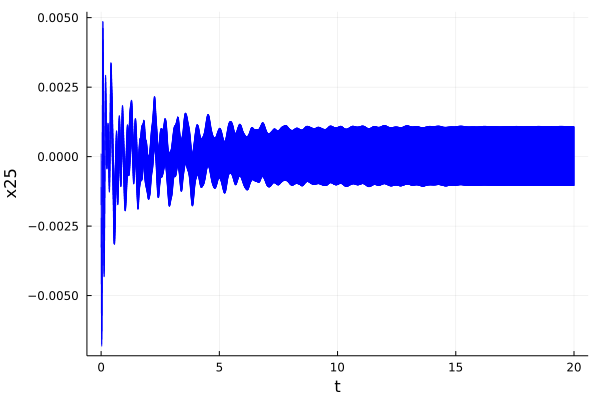

In [4]:
sol_BLDF01_dense = solve(prob_BLDF01, T=20.0, alg=LGG09(δ=0.004, vars=(25), n=48));

plot(sol_BLDF01_dense, vars=(0, 25), linecolor=:blue, color=:blue, alpha=0.8, lw=1.0, xlab="t", ylab="x25")

Safety properties

In [5]:
ρ(x25, sol_BLDF01_dense)

0.004860238896785224

In [6]:
ρ(x25, sol_BLDF01_dense) <= 5.1e-3 # BLDF01 - BDS01

true

In [7]:
ρ(x25, sol_BLDF01_dense) <= 4e-3 # BLDF01 - BDU01

false

In [8]:
ρ(x25, sol_BLDF01_dense(20.0))

0.0010835336749422352

In [9]:
ρ(x25, sol_BLDF01_dense(20.0)) <= -0.78e-3 # BLDF01 - BDU02

false

#### Discrete time

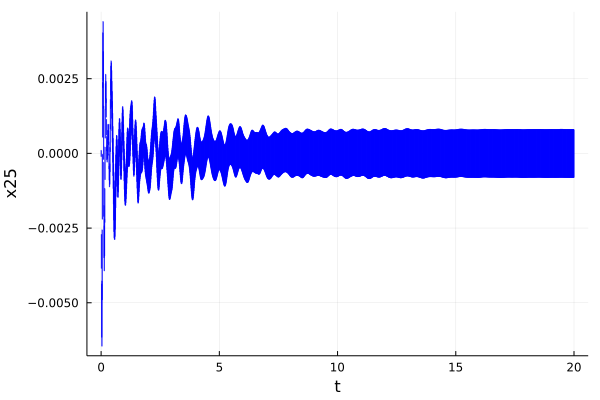

In [10]:
sol_BLDF01_discrete = solve(prob_BLDF01, T=20.0, alg=LGG09(δ=0.01, vars=(25), n=48, approx_model=NoBloating()));

plot(sol_BLDF01_discrete, vars=(0, 25), linecolor=:blue, color=:blue, alpha=0.8, lw=1.0, xlab="t", ylab="x25")

Safety properties

In [11]:
ρ(x25, sol_BLDF01_discrete)

0.004412266117562396

In [12]:
ρ(x25, sol_BLDF01_discrete) <= 5.1e-3 # BLDF01 - BDS01

true

In [13]:
ρ(x25, sol_BLDF01_discrete)

0.004412266117562396

In [14]:
ρ(x25, sol_BLDF01_discrete) <= 4e-3 # BLDF01 - BDU01

false

In [15]:
ρ(x25, sol_BLDF01_discrete(20.0))

0.0007977837510527839

In [16]:
ρ(x25, sol_BLDF01_discrete(20.0)) <= -0.78e-3 # BLDF01 - BDU02

false

### BLDC01

In [17]:
prob_BLDC01 = building_BLDC01()

InitialValueProblem{LinearContinuousSystem{Float64, Matrix{Float64}}, CartesianProduct{Float64, Hyperrectangle{Float64, Vector{Float64}, Vector{Float64}}, Interval{Float64, IntervalArithmetic.Interval{Float64}}}}(LinearContinuousSystem{Float64, Matrix{Float64}}([0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 12.708461033093819 4.866919335674403 … -5.188448853349926 0.0; 0.0 0.0 … 0.0 0.0]), CartesianProduct{Float64, Hyperrectangle{Float64, Vector{Float64}, Vector{Float64}}, Interval{Float64, IntervalArithmetic.Interval{Float64}}}(Hyperrectangle{Float64, Vector{Float64}, Vector{Float64}}([0.000225, 0.000225, 0.000225, 0.000225, 0.000225, 0.000225, 0.000225, 0.000225, 0.000225, 0.000225  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [2.5e-5, 2.5e-5, 2.5e-5, 2.5e-5, 2.5e-5, 2.5e-5, 2.5e-5, 2.5e-5, 2.5e-5, 2.5e-5  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]), Interval{Float64, IntervalArithmetic.Interval{Float64}}([0.8, 1])))

#### Dense time

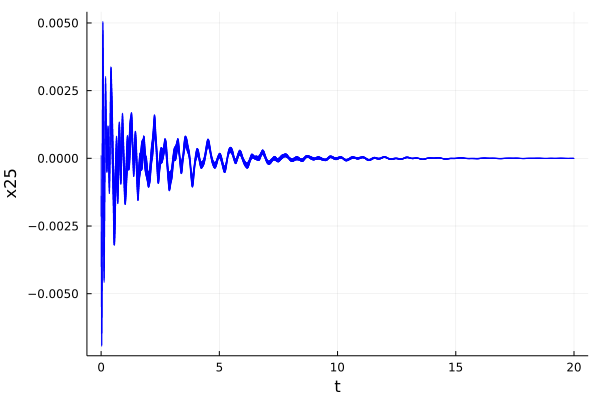

In [18]:
sol_BLDC01_dense = solve(prob_BLDC01, T=20.0, alg=LGG09(δ=0.005, vars=(25), n=49))

plot(sol_BLDC01_dense, vars=(0, 25), linecolor=:blue, color=:blue, alpha=0.8, lw=1.0, xlab="t", ylab="x25")

Safety properties

In [19]:
ρ(x25e, sol_BLDC01_dense)

0.0050526342635462745

In [20]:
ρ(x25e, sol_BLDC01_dense) <= 5.1e-3 # BLDC01 - BDS01

true

In [21]:
ρ(x25e, sol_BLDC01_dense) <= 4e-3 # BLDC01 - BDU01

false

In [22]:
ρ(x25, sol_BLDF01_discrete(20.0))

0.0007977837510527839

In [23]:
ρ(x25e, sol_BLDC01_dense(20.0)) <= -0.78e-3 # BLDC01 - BDU02

false

#### Discrete time

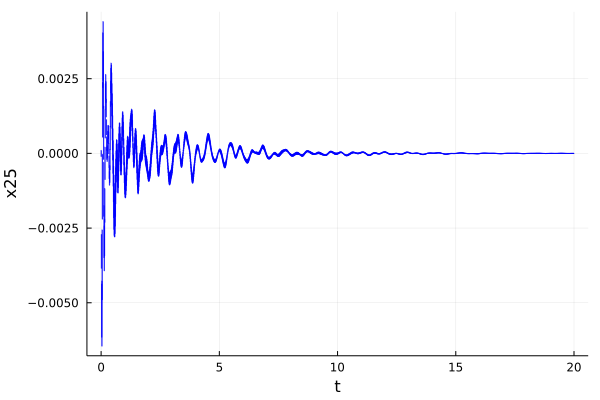

In [24]:
sol_BLDC01_discrete = solve(prob_BLDC01, T=20.0, alg=LGG09(δ=0.01, vars=(25), n=49, approx_model=NoBloating()))

plot(sol_BLDC01_discrete, vars=(0, 25), linecolor=:blue, color=:blue, alpha=0.8, lw=1.0, xlab="t", ylab="x25")

Safety properties

In [25]:
ρ(x25e, sol_BLDC01_discrete)

0.004412266117562397

In [26]:
ρ(x25e, sol_BLDC01_discrete) <= 5.1e-3 # BLDC01 - BDS01

true

In [27]:
ρ(x25e, sol_BLDC01_discrete)

0.004412266117562397

In [28]:
ρ(x25e, sol_BLDC01_discrete) <= 4e-3 # BLDC01 - BDU01

false

In [29]:
ρ(x25e, sol_BLDC01_discrete(20.0))

5.582597411704067e-7

In [30]:
ρ(x25e, sol_BLDC01_discrete(20.0)) <= -0.78e-3 # BLDC01 - BDU02

false

## References

[^ASG00]: Antoulas, Athanasios C., Danny C. Sorensen, and Serkan Gugercin. A survey of model reduction methods for large-scale systems. 2000.

[^TLT16]: Tran, Hoang-Dung, Luan Viet Nguyen, and Taylor T. Johnson. *Large-scale linear systems from order-reduction (benchmark proposal).* 3rd Applied Verification for Continuous and Hybrid Systems Workshop (ARCH), Vienna, Austria. 2016.